## EDA2

In [8]:
import pandas as pd
import os

In [2]:
# !dir ..\input\rfcx-species-audio-detection

 ドライブ D のボリューム ラベルは ボリューム です
 ボリューム シリアル番号は 5C06-DFA8 です

 d:\000_devs\003_kaggle_Rainforest-Connection-Species-Audio-Detection\Rainforest-Connection-Species-Audio-Detection\input\rfcx-species-audio-detection のディレクトリ

2021/01/25  18:08    <DIR>          .
2021/01/25  18:08    <DIR>          ..
2020/11/17  22:20           211,251 sample_submission.csv
2021/01/25  17:42    <DIR>          test
2021/01/25  17:44    <DIR>          tfrecords
2021/01/25  17:50    <DIR>          train
2020/11/18  00:17           351,942 train_fp.csv
2020/11/18  00:17            54,206 train_tp.csv
               3 個のファイル             617,399 バイト
               5 個のディレクトリ  564,964,769,792 バイトの空き領域


In [13]:
import os
import random
import numpy as np
import pandas as pd
from tqdm import tqdm

import seaborn as sns
import IPython.display as ipD
import matplotlib.pyplot as plt
import matplotlib.patches as ptc

import tensorflow as tf

from sklearn.preprocessing import StandardScaler, MinMaxScaler

mm = MinMaxScaler()
ss = StandardScaler()

import librosa
import librosa.display as LD

%matplotlib inline

In [14]:
# paths
test_folder = "../input/rfcx-species-audio-detection/test"
tfrecords = "../input/rfcx-species-audio-detection/tfrecords"
train_folder = "../input/rfcx-species-audio-detection/train"
sample_submission = "../input/rfcx-species-audio-detection/sample_submission.csv"
train_tp = "../input/rfcx-species-audio-detection/train_tp.csv"
train_fp = "../input/rfcx-species-audio-detection/train_fp.csv"

In [15]:
def seedAll(seed):
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    os.environ["PYTHONHASHSEED"]=str(seed)

seedAll(2021)

In [16]:
trtp = pd.read_csv(train_tp)
trtp

,recording_id,species_id,songtype_id,t_min,f_min,t_max,f_max
0,003bec244,14,1,44.5440,2531.250,45.1307,5531.25
1,006ab765f,23,1,39.9615,7235.160,46.0452,11283.40
2,007f87ba2,12,1,39.1360,562.500,42.2720,3281.25
3,0099c367b,17,4,51.4206,1464.260,55.1996,4565.04
4,009b760e6,10,1,50.0854,947.461,52.5293,10852.70
...,...,...,...,...,...,...,...
1211,fe8d9ac40,13,1,53.4720,93.750,54.0960,843.75
1212,fea6b438a,4,1,43.5787,2531.250,45.7653,4031.25
1213,ff2eb9ce5,0,1,15.2267,5906.250,16.0213,8250.00
1214,ffb8d8391,5,1,14.3467,4781.250,16.6987,10406.20


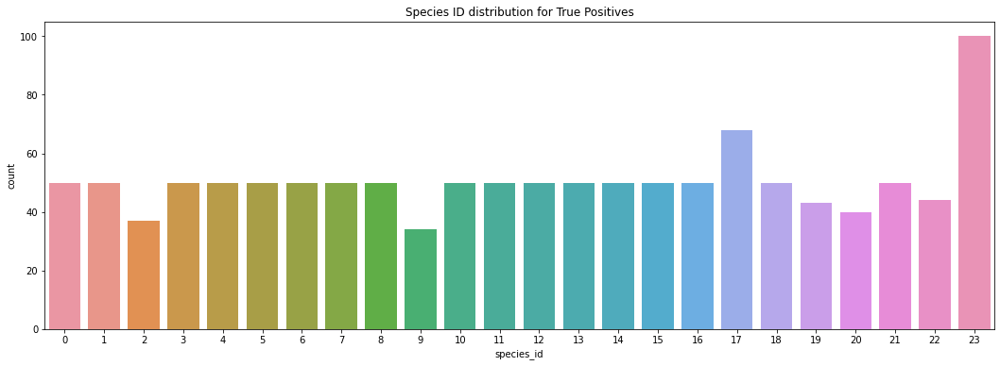

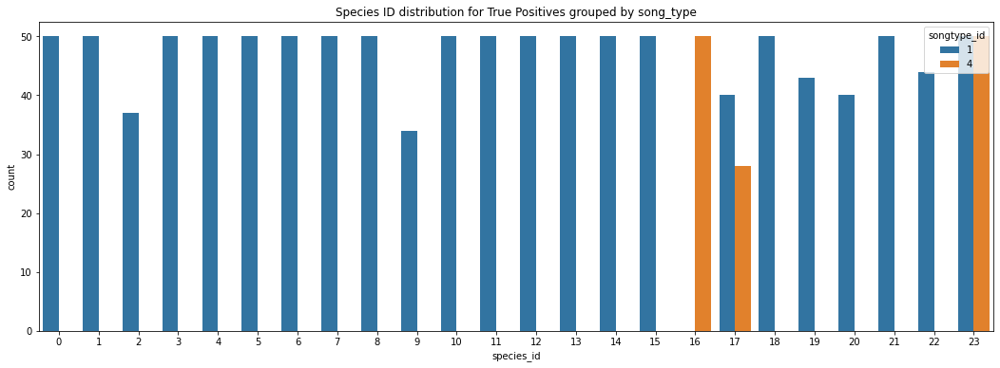

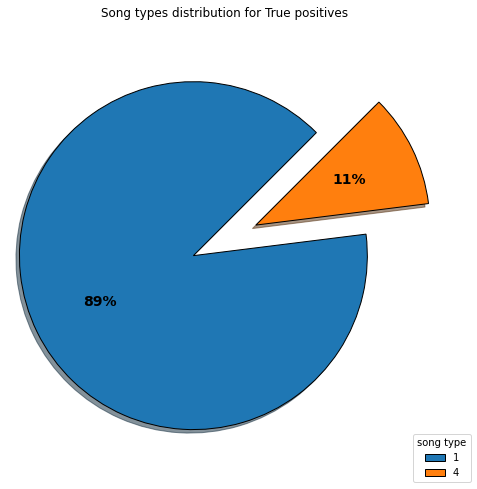

In [17]:
plt.figure(figsize=(18, 6))
sns.countplot(x="species_id", data=trtp)
plt.title("Species ID distribution for True Positives")
plt.show()

plt.figure(figsize=(18, 6))
sns.countplot(x="species_id", hue="songtype_id", data=trtp)
plt.title("Species ID distribution for True Positives grouped by song_type")
plt.show()

plt.figure(figsize=(8, 8))
wegdes, texts, autotexts = plt.pie(trtp["songtype_id"].value_counts(), 
        startangle=45, 
        wedgeprops={"linewidth":1, "edgecolor":"black"}, 
        autopct='%1.f%%', 
        shadow=True,
        textprops= dict(color="black"),
        explode=(0.2, 0.2))
plt.legend(wegdes, trtp["songtype_id"].value_counts().index,
          title="song type",
          loc="center",
          bbox_to_anchor=(1, 0, 0, 0))
plt.setp(autotexts, size=14, weight="bold")
plt.title("Song types distribution for True positives")
plt.show()

In [18]:
trfp = pd.read_csv(train_fp)
trfp

,recording_id,species_id,songtype_id,t_min,f_min,t_max,f_max
0,00204008d,21,1,13.8400,3281.2500,14.9333,4125.0000
1,00204008d,8,1,24.4960,3750.0000,28.6187,5531.2500
2,00204008d,4,1,15.0027,2343.7500,16.8587,4218.7500
3,003b04435,22,1,43.2533,10687.5000,44.8587,13687.5000
4,003b04435,23,1,9.1254,7235.1562,15.2091,11283.3984
...,...,...,...,...,...,...,...
7776,ffd88cd84,14,1,3.2000,2531.2500,3.7867,5531.2500
7777,ffebe7313,1,1,35.2000,3843.7500,36.0960,5625.0000
7778,fff163132,17,4,22.5547,1312.5000,25.0880,7406.2500
7779,fff163132,14,1,37.0827,2531.2500,37.6693,5531.2500


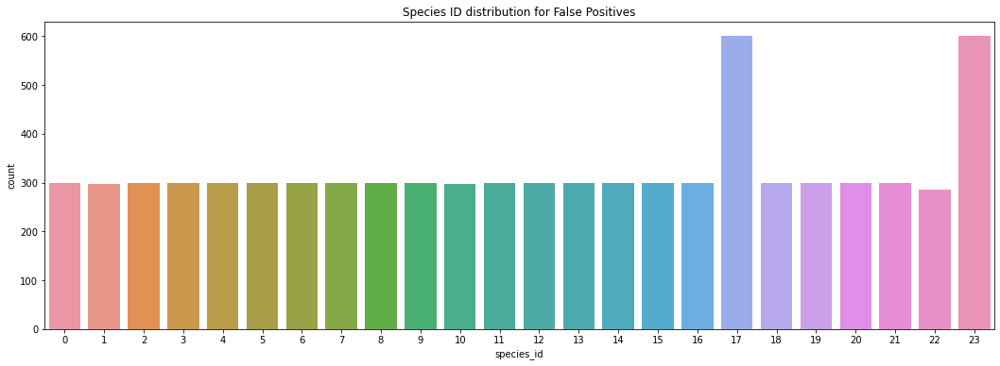

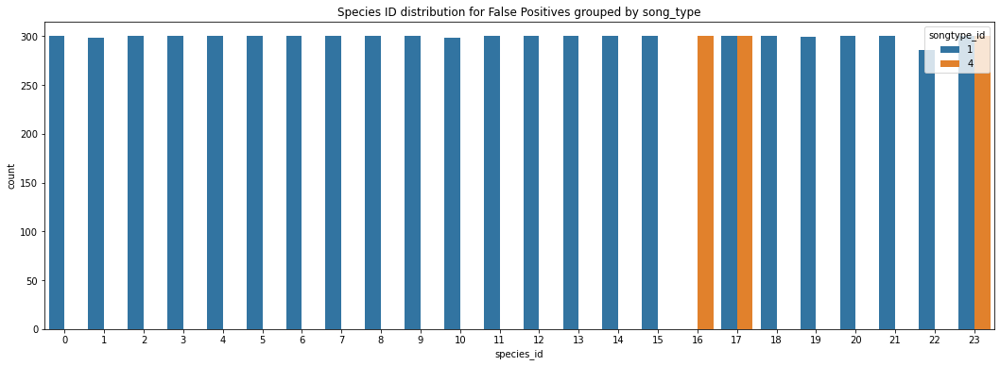

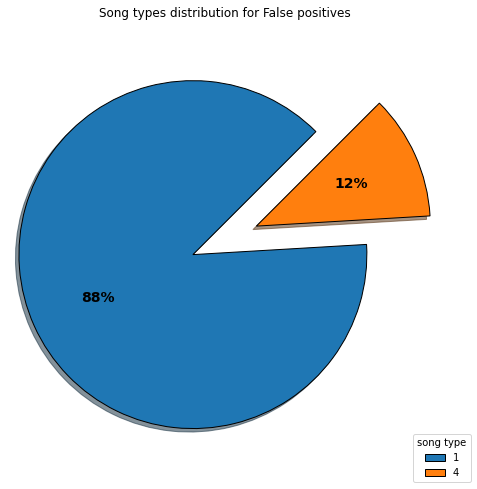

In [19]:
plt.figure(figsize=(18, 6))
sns.countplot(x="species_id", data=trfp)
plt.title("Species ID distribution for False Positives")
plt.show()

plt.figure(figsize=(18, 6))
sns.countplot(x="species_id", hue="songtype_id", data=trfp)
plt.title("Species ID distribution for False Positives grouped by song_type")
plt.show()

plt.figure(figsize=(8, 8))
wegdes, texts, autotexts = plt.pie(trfp["songtype_id"].value_counts(), 
        startangle=45, 
        wedgeprops={"linewidth":1, "edgecolor":"black"}, 
        autopct='%1.f%%', 
        shadow=True,
        textprops= dict(color="black"),
        explode=(0.2, 0.2))
plt.legend(wegdes, trfp["songtype_id"].value_counts().index,
          title="song type",
          loc="center",
          bbox_to_anchor=(1, 0, 0, 0))
plt.setp(autotexts, size=14, weight="bold")
plt.title("Song types distribution for False positives")
plt.show()


In [20]:
print("Total Train audio samples: ", len(os.listdir(train_folder)))
print("Total Test audio samples: ", len(os.listdir(test_folder)))
print("Number of samples present both in Train True Positives and Train False Positives: ", len(set(trfp.recording_id.tolist()).intersection(trtp.recording_id.tolist())))
print("Number of unique audio samples in Train True positives: ", trtp.recording_id.nunique())
print("Number of unique audio samples in Train False positives: ", trfp.recording_id.nunique())

Total Train audio samples:  4727
Total Test audio samples:  1992
Number of samples present both in Train True Positives and Train False Positives:  363
Number of unique audio samples in Train True positives:  1132
Number of unique audio samples in Train False positives:  3958


C:\Users\tatsuya.takahashi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
<ipython-input-21-bd2ba9bd8b86>:9: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


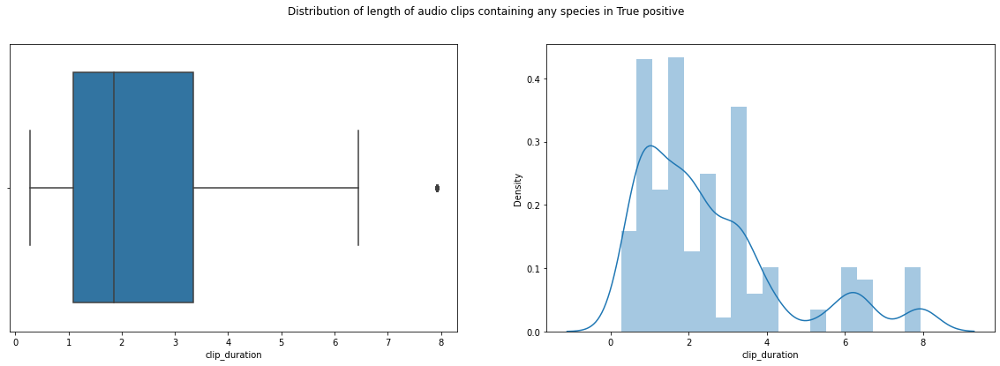

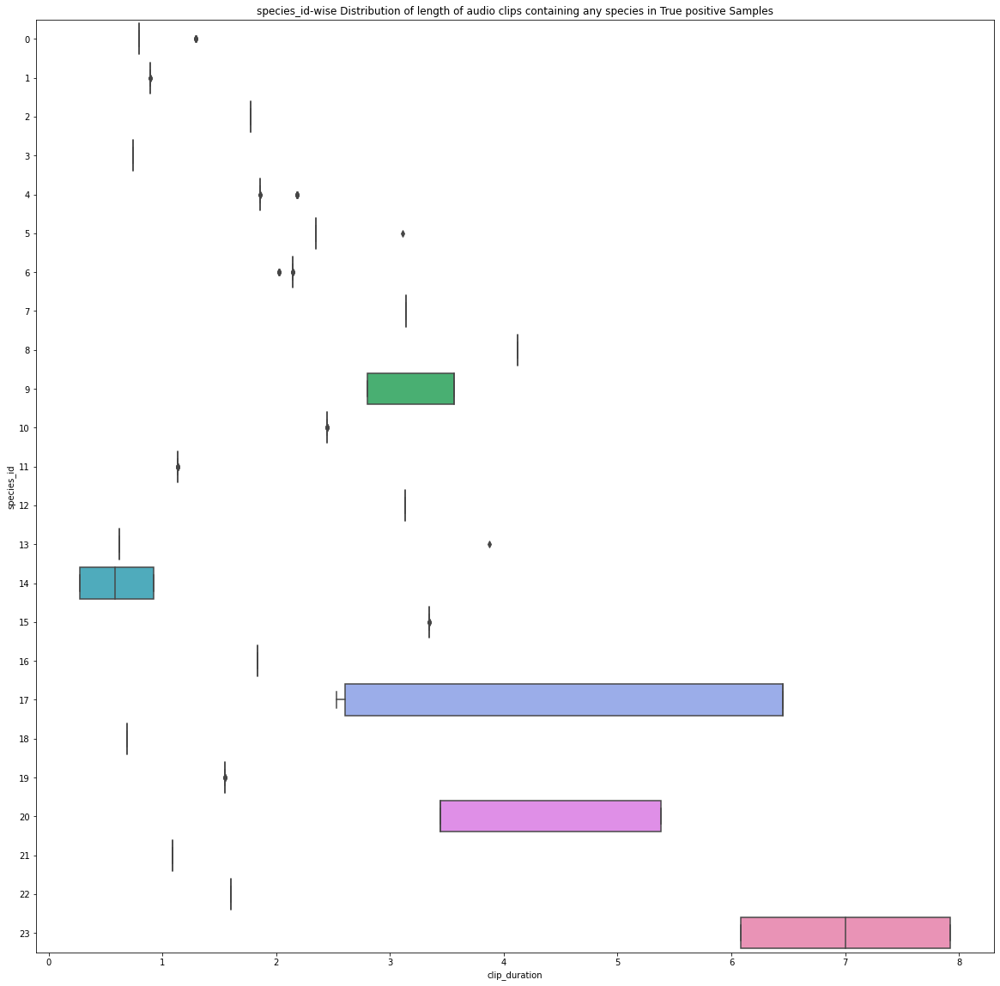

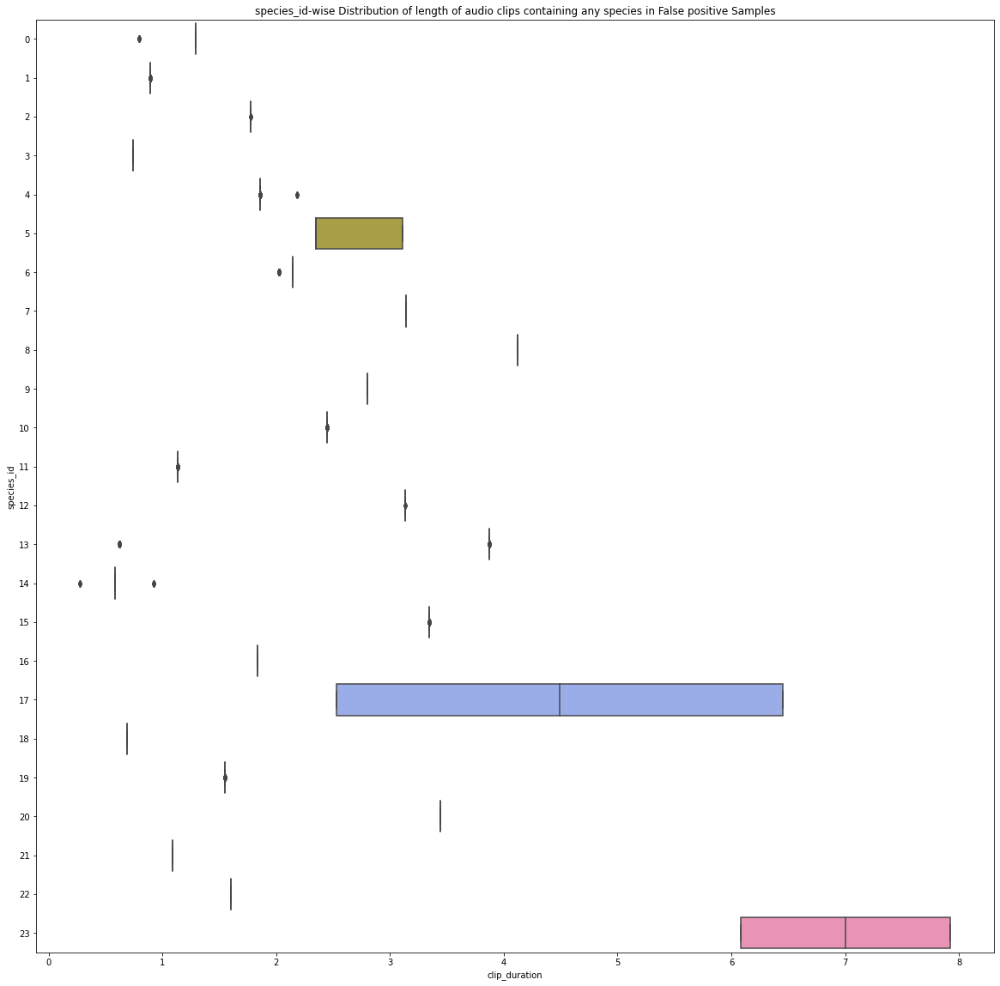

In [21]:
trtp["clip_duration"] = trtp["t_max"] - trtp["t_min"]
trfp["clip_duration"] = trfp["t_max"] - trfp["t_min"]

fig, ax = plt.subplots(1, 2, figsize=(20, 6))
sns.boxplot(x="clip_duration", data=trtp, orient="h", ax=ax[0])
sns.distplot(trtp["clip_duration"], kde=True, ax=ax[1])

fig.suptitle("Distribution of length of audio clips containing any species in True positive")
fig.show()

plt.figure(figsize=(20, 20))
sns.boxplot(x="clip_duration", y="species_id", data=trtp, orient="h")
plt.title("species_id-wise Distribution of length of audio clips containing any species in True positive Samples")
plt.show()

plt.figure(figsize=(20, 20))
sns.boxplot(x="clip_duration", y="species_id", data=trfp, orient="h")
plt.title("species_id-wise Distribution of length of audio clips containing any species in False positive Samples")
plt.show()

C:\Users\tatsuya.takahashi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
<ipython-input-22-fe64e4ff7621>:9: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


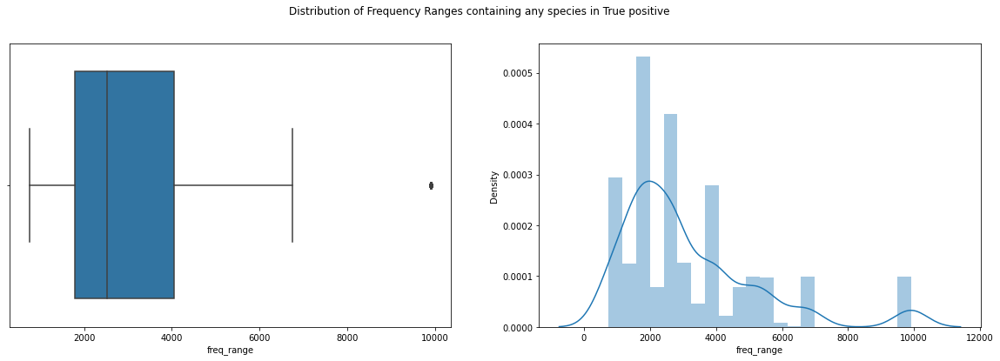

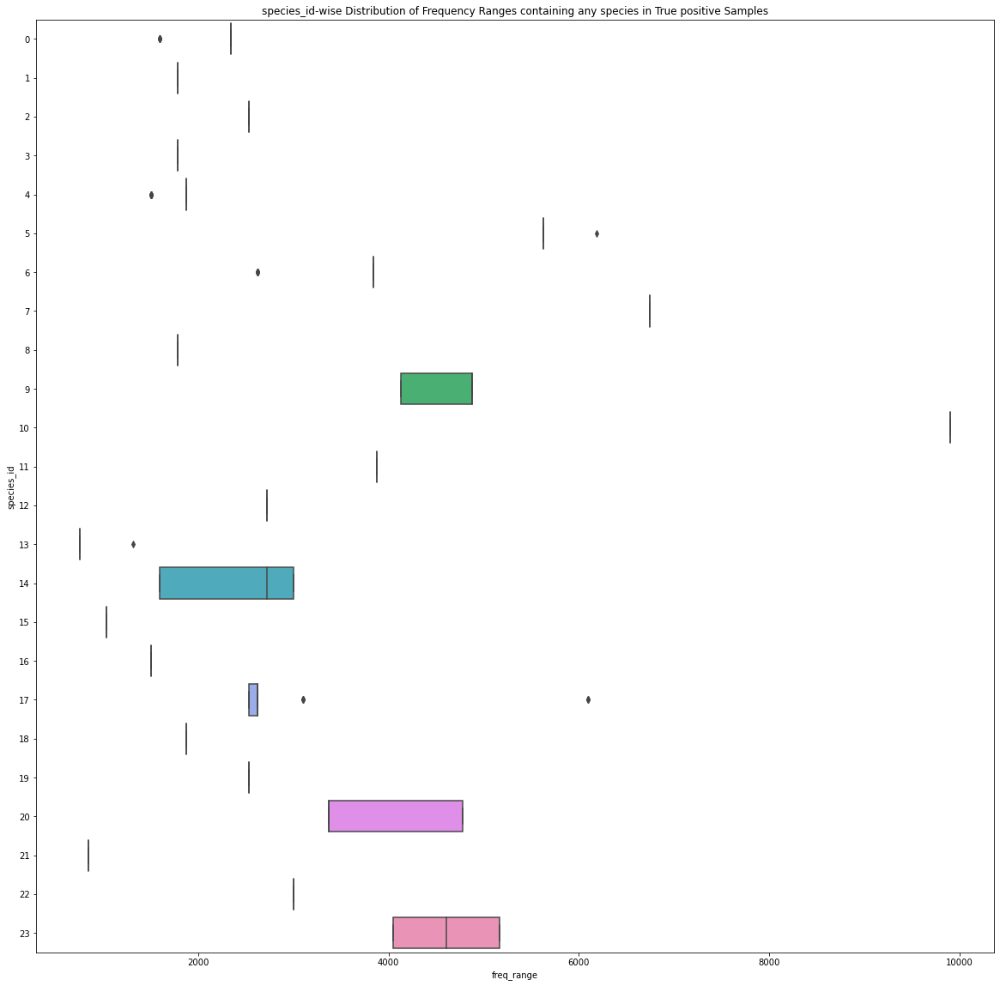

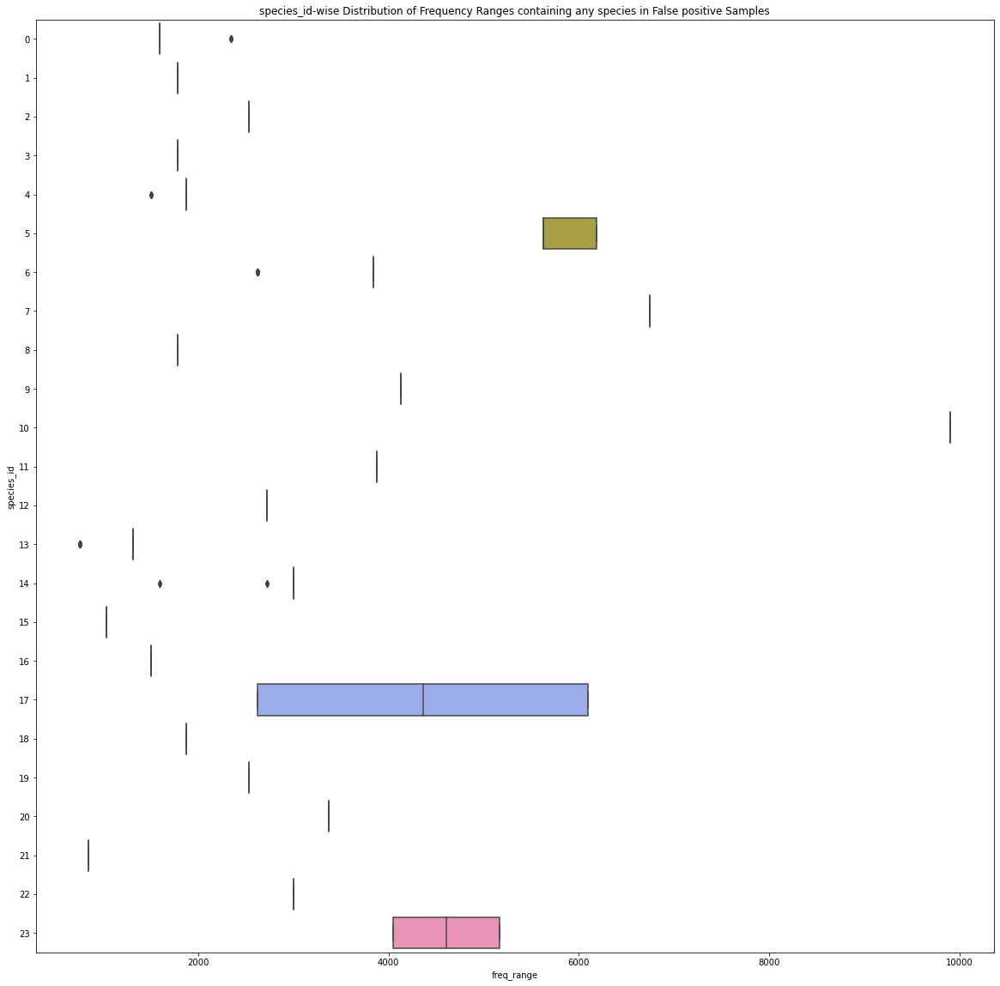

In [22]:
trtp["freq_range"] = trtp["f_max"] - trtp["f_min"]
trfp["freq_range"] = trfp["f_max"] - trfp["f_min"]

fig, ax = plt.subplots(1, 2, figsize=(20, 6))
sns.boxplot(x="freq_range", data=trtp, orient="h", ax=ax[0])
sns.distplot(trtp["freq_range"], kde=True, ax=ax[1])

fig.suptitle("Distribution of Frequency Ranges containing any species in True positive")
fig.show()

plt.figure(figsize=(20, 20))
sns.boxplot(x="freq_range", y="species_id", data=trtp, orient="h")
plt.title("species_id-wise Distribution of Frequency Ranges containing any species in True positive Samples")
plt.show()

plt.figure(figsize=(20, 20))
sns.boxplot(x="freq_range", y="species_id", data=trfp, orient="h")
plt.title("species_id-wise Distribution of Frequency Ranges containing any species in False positive Samples")
plt.show()

<ipython-input-23-01b07e68f5be>:9: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


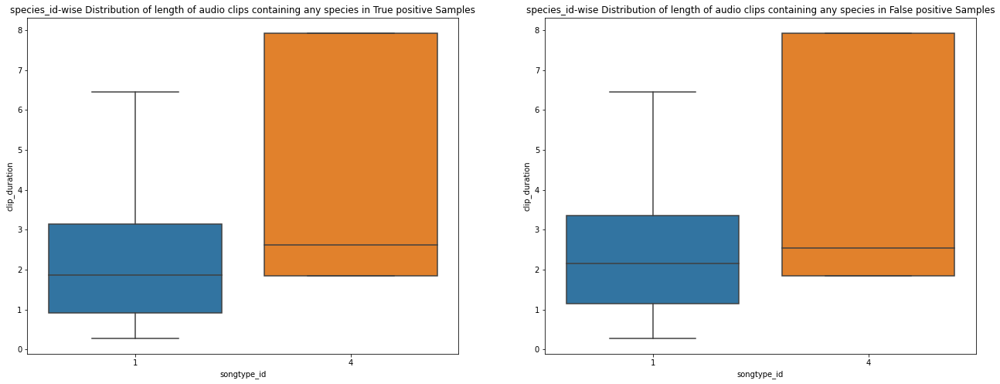

In [23]:
fig, axs = plt.subplots(1, 2, figsize=(22, 8))

sns.boxplot(y="clip_duration", x="songtype_id", data=trtp, ax=axs[0])
axs[0].set_title("species_id-wise Distribution of length of audio clips containing any species in True positive Samples")

sns.boxplot(y="clip_duration", x="songtype_id", data=trfp, ax=axs[1])
axs[1].set_title("species_id-wise Distribution of length of audio clips containing any species in False positive Samples")

fig.show()

<ipython-input-24-967ae42427df>:9: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


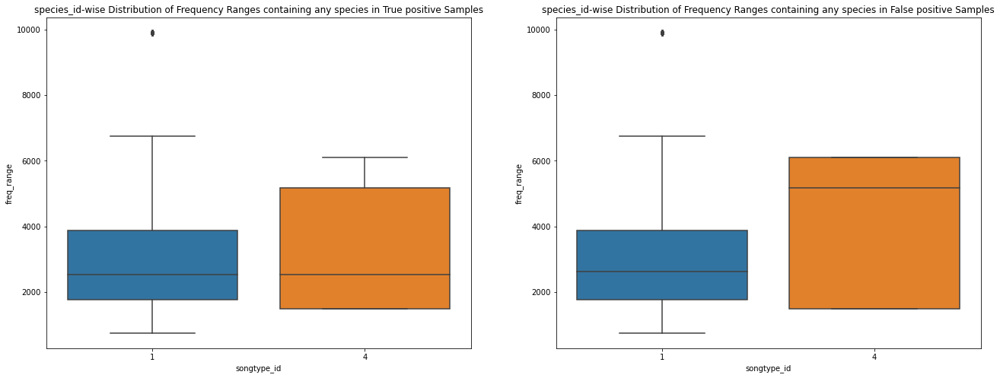

In [24]:
fig, axs = plt.subplots(1, 2, figsize=(22, 8))

sns.boxplot(y="freq_range", x="songtype_id", data=trtp, ax=axs[0])
axs[0].set_title("species_id-wise Distribution of Frequency Ranges containing any species in True positive Samples")

sns.boxplot(y="freq_range", x="songtype_id", data=trfp, ax=axs[1])
axs[1].set_title("species_id-wise Distribution of Frequency Ranges containing any species in False positive Samples")

fig.show()

In [37]:
# choose a sample from train and test
tr = os.path.join(train_folder, os.listdir(train_folder)[np.random.randint(0, len(os.listdir(train_folder)))])
ts = os.path.join(test_folder, os.listdir(test_folder)[np.random.randint(0, len(os.listdir(test_folder)))])

# load the np array and the samping rate
trx, trsr = librosa.load(tr)
tsx, tssr = librosa.load(ts)
recId_train = (tr.split("/")[-1]).split(".")[0]
recId_test = (ts.split("/")[-1]).split(".")[0]

recId_train = (tr.split("\\")[-1]).split(".")[0]
recId_test = (ts.split("\\")[-1]).split(".")[0]

print("="*10, "Training Sample", "="*10)
display(trfp[trfp["recording_id"]==recId_train] if recId_train in trfp["recording_id"].tolist() else trtp[trtp["recording_id"]==recId_train])
print("="*10, "Test Sample", "="*10)
print("Test Data: ", recId_test)

========== Training Sample ==========


,recording_id,species_id,songtype_id,t_min,f_min,t_max,f_max,clip_duration,freq_range
1025,d635637b7,5,1,20.5067,4781.25,22.8587,10406.2,2.352,5624.95


========== Test Sample ==========
Test Data:  06011bbad


In [38]:
recId_train

'd635637b7'

In [39]:
# print the shape and the sampling rate
print("=====Train sample=======")
print(trx.shape, trsr)
print("=====Test sample=======")
print(tsx.shape, tssr)

=====Train sample=======
(1323000,) 22050
=====Test sample=======
(1323000,) 22050


In [41]:
ipD.Audio(trx, rate=trsr)

In [43]:
ipD.Audio(tsx, rate=tssr)s

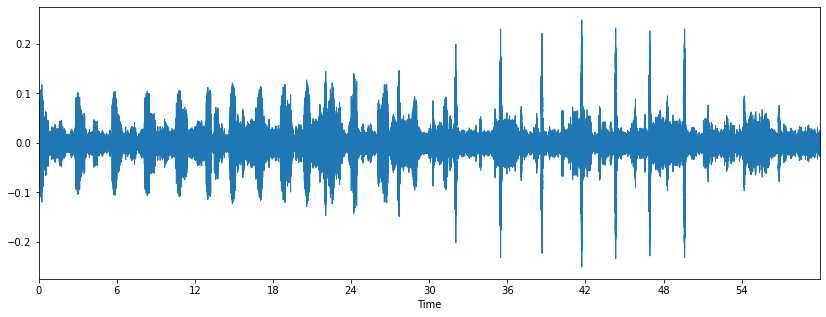

In [48]:
# librosa display(train audio)
plt.figure(figsize=(14, 5))
LD.waveplot(trx, sr=trsr)
plt.show()

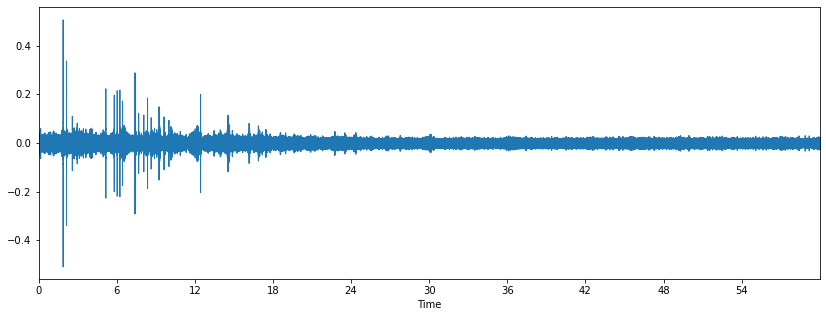

In [49]:
# test audio clip
plt.figure(figsize=(14, 5))
LD.waveplot(tsx, sr=tssr)
plt.show()

Shape of the stft:  (1025, 2584)


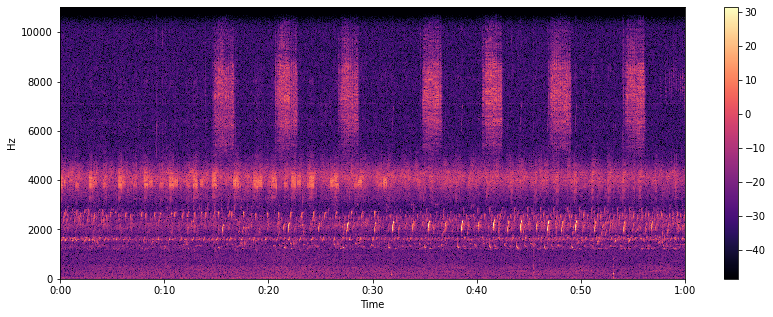

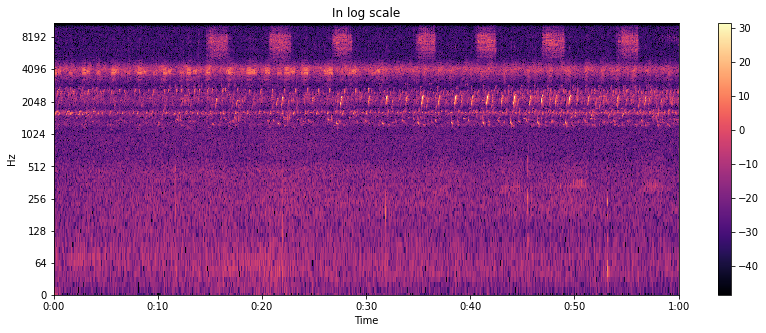

In [52]:
# train spectrogram
# shor time fourie transform
TRX = librosa.stft(trx)
print("Shape of the stft: ", TRX.shape)

# convert into db
TRXdb = librosa.amplitude_to_db(abs(TRX))

# Spectrogram
plt.figure(figsize=(14, 5))
librosa.display.specshow(TRXdb, sr=trsr, x_axis='time', y_axis='hz')
plt.colorbar()
plt.figure(figsize=(14, 5))
librosa.display.specshow(TRXdb, sr=trsr, x_axis='time', y_axis='log')
plt.title("In log scale")
plt.colorbar()
plt.show()

- 20秒あたりに高周波数の表示がでてる，ここに種がいるのかもしれない

Shape of the stft:  (1025, 2584)


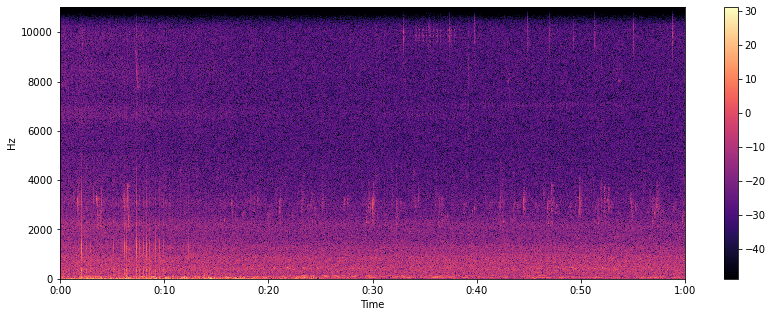

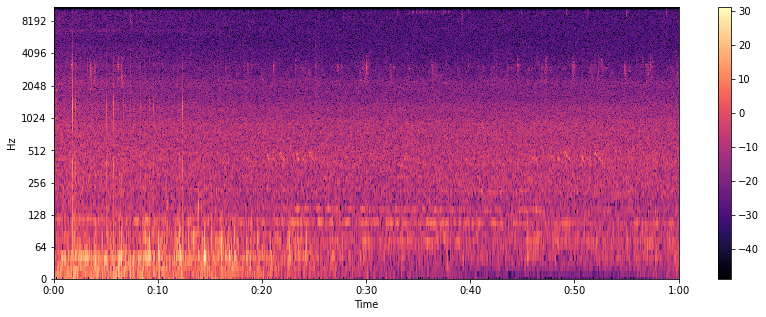

In [53]:
# convert into fourier transform
TSX = librosa.stft(tsx)
print("Shape of the stft: ", TSX.shape)

# convert into bd
TSXdb = librosa.amplitude_to_db(abs(TSX))
plt.figure(figsize=(14, 5))
librosa.display.specshow(TSXdb, sr=tssr, x_axis='time', y_axis='hz')
plt.colorbar()
plt.figure(figsize=(14, 5))
librosa.display.specshow(TSXdb, sr=tssr, x_axis='time', y_axis='log')
plt.colorbar()
plt.show()

Shape of the spectral centroids:  (2584,)


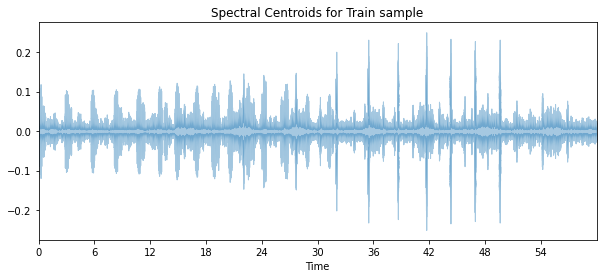

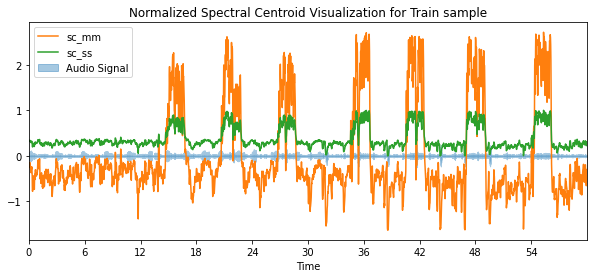

In [54]:
# スペクトル重心
spectral_centroids = librosa.feature.spectral_centroid(trx, sr=trsr)[0]
print("Shape of the spectral centroids: ", spectral_centroids.shape)

# extract the time and frame indices
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)

plt.figure(figsize=(10, 4))
LD.waveplot(trx, sr=trsr, alpha=0.4)
plt.title("Spectral Centroids for Train sample")
plt.show()

plt.figure(figsize=(10, 4))
LD.waveplot(trx, sr=trsr, alpha=0.4)
plt.plot(t, ss.fit_transform(spectral_centroids.reshape(-1, 1)))
plt.plot(t, mm.fit_transform(spectral_centroids.reshape(-1, 1)))
plt.legend(["Audio Signal", "sc_ss", "sc_mm"][::-1])
plt.title("Normalized Spectral Centroid Visualization for Train sample")
plt.show()

Shape of the spectral centroids:  (2584,)


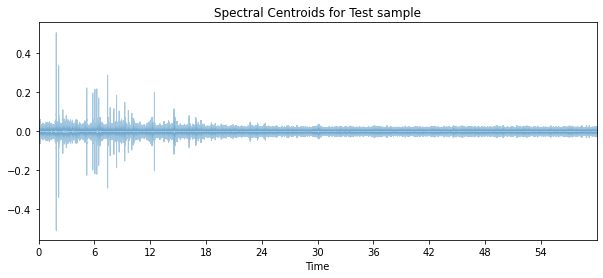

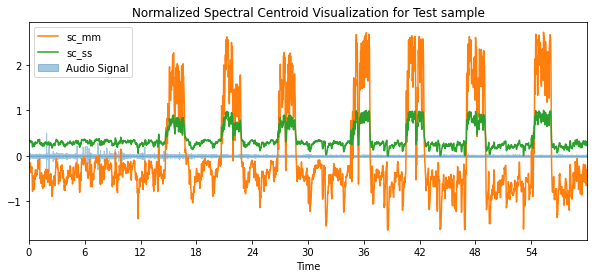

In [55]:
print("Shape of the spectral centroids: ", spectral_centroids.shape)

# extract the time and frame indices
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)

plt.figure(figsize=(10, 4))
LD.waveplot(tsx, sr=tssr, alpha=0.4)
plt.title("Spectral Centroids for Test sample")
plt.show()

plt.figure(figsize=(10, 4))
LD.waveplot(tsx, sr=tssr, alpha=0.4)
plt.plot(t, ss.fit_transform(spectral_centroids.reshape(-1, 1)))
plt.plot(t, mm.fit_transform(spectral_centroids.reshape(-1, 1)))
plt.legend(["Audio Signal", "sc_ss", "sc_mm"][::-1])
plt.title("Normalized Spectral Centroid Visualization for Test sample")
plt.show()

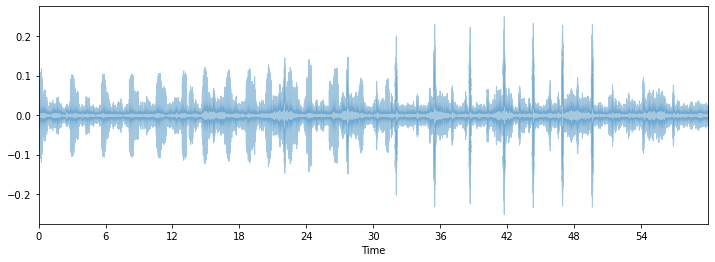

In [56]:
# rolloff
spectral_rolloff = librosa.feature.spectral_rolloff(trx+0.01, sr=trsr)
frames = range(len(spectral_rolloff))
t = librosa.frames_to_time(frames)

plt.figure(figsize=(12, 4))
LD.waveplot(trx, sr=trsr, alpha=0.4)
plt.plot(t, ss.fit_transform(spectral_rolloff), color='r')
plt.show()

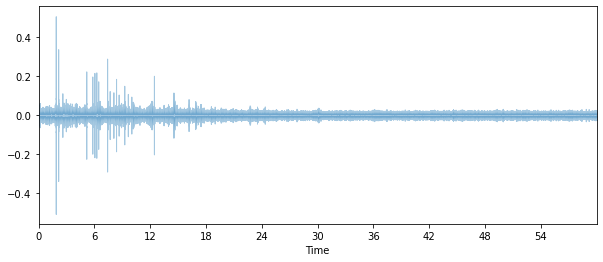

In [57]:
spectral_rolloff = librosa.feature.spectral_rolloff(tsx, sr=tssr)
frames = range(len(spectral_rolloff))
t = librosa.frames_to_time(frames)

plt.figure(figsize=(10, 4))
LD.waveplot(tsx, sr=tssr, alpha=0.4)
plt.plot(t, ss.fit_transform(spectral_rolloff), color="r")
plt.show()

(20, 2584)


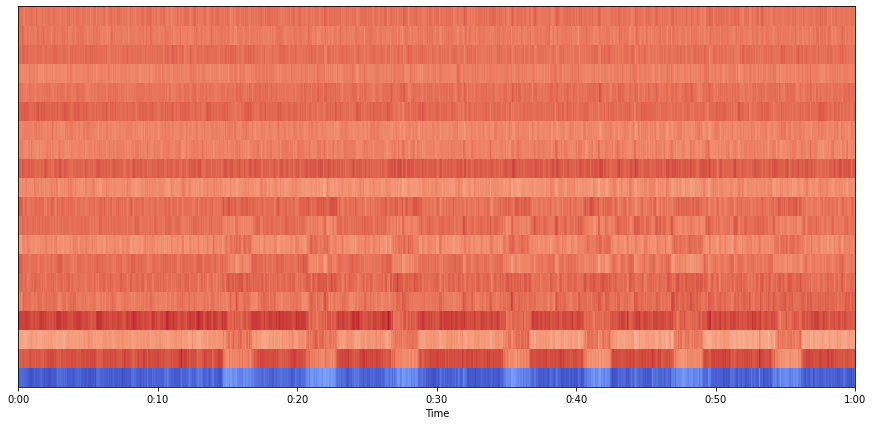

In [58]:
mfccs = librosa.feature.mfcc(trx, sr=trsr)
print(mfccs.shape)
#Displaying  the MFCCs:
plt.figure(figsize=(15, 7))
LD.specshow(mfccs, sr=trsr, x_axis='time')
plt.show()

(20, 2584)


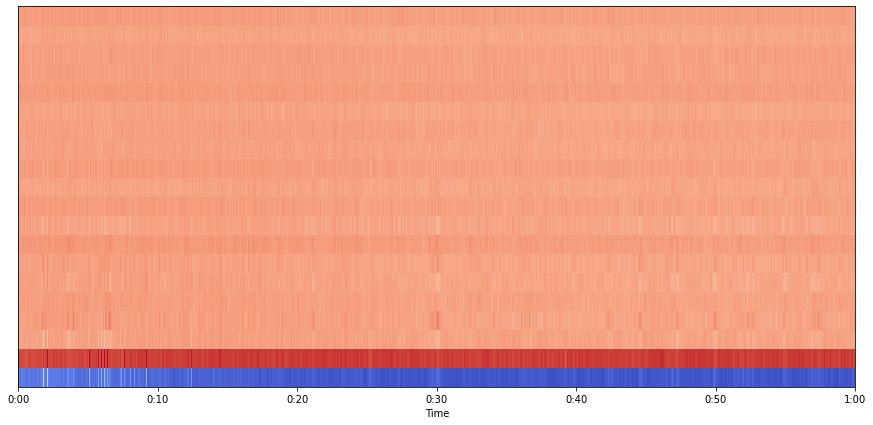

In [59]:
mfccs = librosa.feature.mfcc(tsx, sr=tssr)
print(mfccs.shape)
#Displaying  the MFCCs:
plt.figure(figsize=(15, 7))
LD.specshow(mfccs, sr=tssr, x_axis='time')
plt.show()

(128, 2584)


C:\Users\tatsuya.takahashi\anaconda3\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
C:\Users\tatsuya.takahashi\anaconda3\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


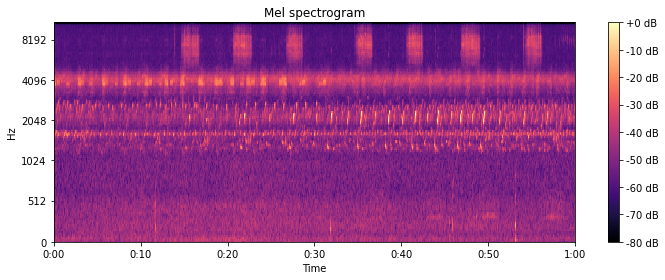

In [60]:
melspec = librosa.feature.melspectrogram(trx, sr=trsr)
print(melspec.shape)
plt.figure(figsize=(10, 4))
librosa.display.specshow(librosa.power_to_db(melspec, ref=np.max),
                         y_axis='mel',
                         x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel spectrogram')
plt.tight_layout()

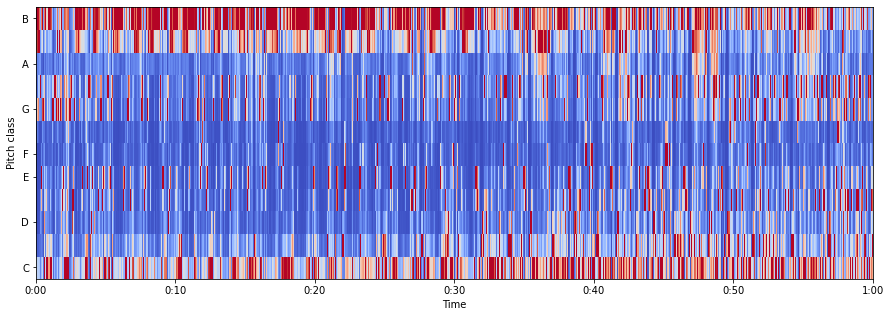

In [61]:
hop_length=12
chromagram = librosa.feature.chroma_stft(trx, sr=trsr, hop_length=hop_length)
plt.figure(figsize=(15, 5))
LD.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')
plt.show()

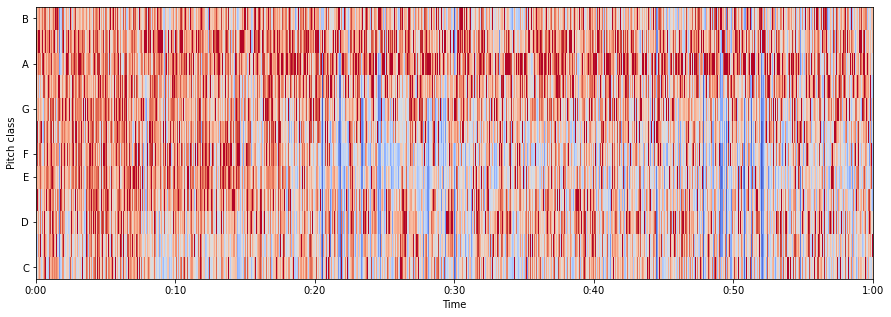

In [62]:
chromagram = librosa.feature.chroma_stft(tsx, sr=tssr, hop_length=hop_length)
plt.figure(figsize=(15, 5))
LD.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')
plt.show()

In [63]:
samSub = pd.read_csv(sample_submission)
samSub

,recording_id,s0,s1,s2,s3,s4,s5,s6,s7,s8,...,s14,s15,s16,s17,s18,s19,s20,s21,s22,s23
0,000316da7,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,...,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5
1,003bc2cb2,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,...,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5
2,0061c037e,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,...,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5
3,010eb14d3,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,...,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5
4,011318064,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,...,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1987,ff68f3ac3,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,...,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5
1988,ff973e852,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,...,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5
1989,ffa5cf6d6,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,...,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5
1990,ffa88cbb8,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,...,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5


In [85]:
# check duplication
samSub.groupby('recording_id', as_index=False).count()['s0'].sum()

1992

In [64]:
train_tfrec = "../input/rfcx-species-audio-detection/tfrecords/train"
test_tfrec = "../input/rfcx-species-audio-detection/tfrecords/test"

train_tfrecs = sorted(tf.io.gfile.glob(train_tfrec + "/*.tfrec"))
test_tfrecs = sorted(tf.io.gfile.glob(test_tfrec + "/*.tfrec"))

print("Number of train tfrecords: ", len(train_tfrecs))
print("Number of test tfrecords: ", len(test_tfrecs))

Number of train tfrecords:  32
Number of test tfrecords:  32


In [65]:
sample_proto_train_tfrec = tf.data.TFRecordDataset([train_tfrecs[0]])
sample_proto_train_tfrec

<TFRecordDatasetV2 shapes: (), types: tf.string>

In [66]:
print("Number of samples in one single record: ", sample_proto_train_tfrec.reduce(np.int64(), lambda x, _: x+1).numpy())

Number of samples in one single record:  148


In [67]:
CUT_TIME = 10 # cutting window in seconds
SAMPLE_TIME = 6
SR = 48000
FMAX = 24000
FMIN = 40
# feature description for the tfrecords
# this will parsed as arguments into tf.io.parse_single_example
feature_description = {
    'recording_id': tf.io.FixedLenFeature([], tf.string, default_value=''),
    'audio_wav': tf.io.FixedLenFeature([], tf.string, default_value=''),
    'label_info': tf.io.FixedLenFeature([], tf.string, default_value=''),
}
parse_dtype = {
    'audio_wav': tf.float32,
    'recording_id': tf.string,
    'species_id': tf.int32,
    'songtype_id': tf.int32,
    't_min': tf.float32,
    'f_min': tf.float32,
    't_max': tf.float32,
    'f_max':tf.float32,
    'is_tp': tf.int32
}

# define a fun to read the encoded tfrec
@tf.function
def _parse_fun(sample):
    sample = tf.io.parse_single_example(sample, feature_description) # this returns a dicionary of the features for a single tfrec
    audio, _ = tf.audio.decode_wav(sample["audio_wav"], desired_channels=1)
    label_info = tf.strings.split(sample["label_info"], ";")
    labels = tf.strings.regex_replace(label_info, '"', '')
    
    @tf.function
    def _cut_audio(label):
        items = tf.strings.split(label, sep=',')
        spid = tf.squeeze(tf.strings.to_number(items[0], tf.int32))
        soid = tf.squeeze(tf.strings.to_number(items[1], tf.int32))
        tmin = tf.squeeze(tf.strings.to_number(items[2]))
        fmin = tf.squeeze(tf.strings.to_number(items[3]))
        tmax = tf.squeeze(tf.strings.to_number(items[4]))
        fmax = tf.squeeze(tf.strings.to_number(items[5]))
        tp = tf.squeeze(tf.strings.to_number(items[6], tf.int32))

        tmax_s = tmax * tf.cast(SR, tf.float32)
        tmin_s = tmin * tf.cast(SR, tf.float32)
        cut_s = tf.cast(CUT_TIME * SR, tf.float32)
        all_s = tf.cast(60 * SR, tf.float32)
        tsize_s = tmax_s - tmin_s
        cut_min = tf.cast(
            tf.maximum(0.0, 
                tf.minimum(tmin_s - (cut_s - tsize_s) / 2,
                           tf.minimum(tmax_s + (cut_s - tsize_s) / 2,
                                      all_s) - cut_s)
            ), tf.int32
        )
        cut_max = cut_min + CUT_TIME * SR
        
        _sample = {
            'audio_wav': tf.reshape(audio[cut_min:cut_max], [CUT_TIME*SR]),
            'recording_id': sample['recording_id'],
            'species_id': spid,
            'songtype_id': soid,
            't_min': tmin - tf.cast(cut_min, tf.float32)/tf.cast(SR, tf.float32),
            'f_min': fmin,
            't_max': tmax - tf.cast(cut_min, tf.float32)/tf.cast(SR, tf.float32),
            'f_max': fmax,
            'is_tp': tp
        }
        return _sample
    
    samples = tf.map_fn(_cut_audio, labels, dtype=parse_dtype)
    return samples
    pass

In [68]:
parsed_tfrecs_sample = sample_proto_train_tfrec.map(_parse_fun).unbatch()

Instructions for updating:
Use fn_output_signature instead


In [69]:
sample = next(iter(parsed_tfrecs_sample))

for key, val in sample.items():
    print(key, ":", val)

audio_wav : tf.Tensor(
[ 0.00537109 -0.0007019   0.00354004 ...  0.01443481  0.01226807
  0.01107788], shape=(480000,), dtype=float32)
recording_id : tf.Tensor(b'003bec244', shape=(), dtype=string)
species_id : tf.Tensor(14, shape=(), dtype=int32)
songtype_id : tf.Tensor(1, shape=(), dtype=int32)
t_min : tf.Tensor(4.706665, shape=(), dtype=float32)
f_min : tf.Tensor(2531.25, shape=(), dtype=float32)
t_max : tf.Tensor(5.2933655, shape=(), dtype=float32)
f_max : tf.Tensor(5531.25, shape=(), dtype=float32)
is_tp : tf.Tensor(1, shape=(), dtype=int32)


In [70]:
@tf.function
def cut_audio(sample, istrain=True):
    # random cutting for train samples
    if istrain:
        cut_min = tf.random.uniform([],
                                    maxval=(CUT_TIME-SAMPLE_TIME) * SR,
                                    dtype=tf.int32)
    else:
        # center cropping for validation data
        cut_min = (CUT_TIME - SAMPLE_TIME) * SR//2
    cut_max = cut_min + SAMPLE_TIME * SR
    cutaudio = tf.reshape(
        sample["audio_wav"][cut_min:cut_max], [SAMPLE_TIME * SR]
    )

    result = {}
    result.update(sample)
    result["audio_wav"] = cutaudio
    result["t_min"] = tf.maximum(0.0, sample["t_min"] - tf.cast(cut_min, tf.float32)/SR)
    result["t_max"] = tf.maximum(0.0, sample["t_max"] - tf.cast(cut_min, tf.float32)/SR)
    return result
    pass

In [71]:
@tf.function
def waveToSpec(sample):
    mel_power = 2
    stfts = tf.signal.stft(sample["audio_wav"],
                           frame_length=2048,
                           frame_step=512,
                           fft_length=2048)
    spectograms = tf.abs(stfts) ** mel_power

    # convert into mel scale
    mel_weight = tf.signal.linear_to_mel_weight_matrix(
        num_mel_bins=224,  # or can be said as the no of MFCCs, though theoretically, ideal value should be in 30-50 range, let's try with 224 for image size
        num_spectrogram_bins=stfts.shape[-1],
        sample_rate=SR,
        lower_edge_hertz=FMIN,
        upper_edge_hertz=FMAX
    )
    mel_spectrograms = tf.tensordot(
        spectograms, mel_weight, 1
    )
    mel_spectrograms.set_shape(spectograms.shape[:-1].concatenate(mel_weight.shape[-1:]))
    log_mel_spectograms = tf.math.log(mel_spectrograms + 1e-6)

    results = {
        "audio_spec": tf.transpose(log_mel_spectograms)  # of shape (num_mel_spec_bins, num_frames)
    }
    results.update(sample)
    return results
    pass

In [72]:
@tf.function
def filter_tp(sample):
    """

    :param sample: Processed dictionary from _parse_function
    :return: boolean, whether belongs to true positive or false positive
    """
    return sample["is_tp"] == 1
    pass

In [73]:
@tf.function
def create_annot(sample):
    target = tf.one_hot(sample["species_id"],
                        24,
                        on_value=sample["is_tp"],
                        off_value=0)

    return {
        "input": sample["audio_spec"],  # obtained from creating spectograms from audio np arrays
        "target": tf.cast(target, tf.float32)
    }
    pass

In [74]:
@tf.function
def toImage(logmelSpec):
    # expand one dimension axis to be treated as image
    image = tf.expand_dims(logmelSpec, axis=-1)
    image = tf.image.resize(image, (224, 512))
    image = tf.image.per_image_standardization(image)

    # no augmentation at this stage
    image = (image - tf.reduce_mean(image))/(tf.reduce_max(image) * tf.reduce_min(image)) * 255.0
    image = tf.image.grayscale_to_rgb(image)
    # image = cfg.model_params["preprocess"](image)
    return image
    pass


@tf.function
def preprocess_img(sample):
    image = toImage(sample["input"])
    return image, sample["target"]
    pass

In [75]:
# let's extract the samples from the tfrecs and create our initial processed dataset
spec_dataset = parsed_tfrecs_sample.filter(filter_tp).map(cut_audio).map(waveToSpec)
img_dataset = spec_dataset.map(create_annot).map(preprocess_img)

C:\Users\tatsuya.takahashi\anaconda3\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
C:\Users\tatsuya.takahashi\anaconda3\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


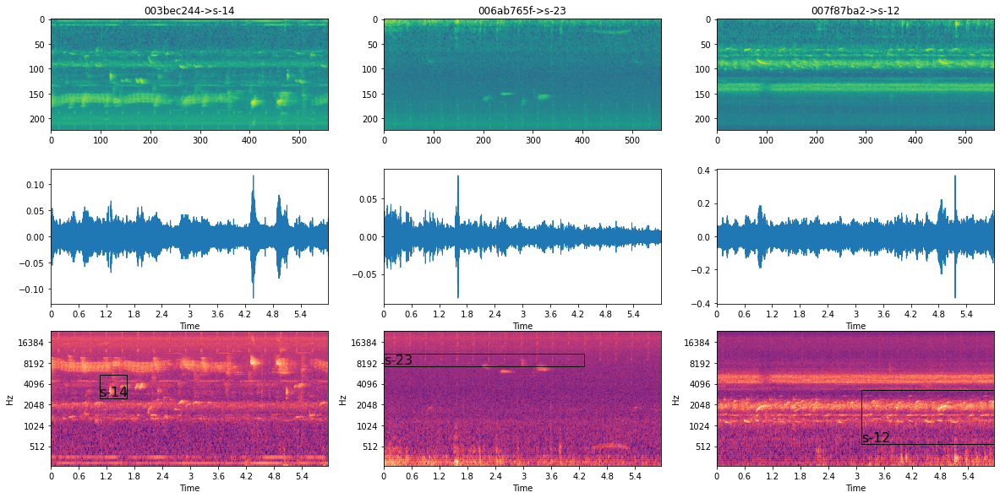

In [76]:
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(20, 10))
for i, s in enumerate(spec_dataset.take(3)):
    axs[0, i].imshow(s['audio_spec'])
    axs[0, i].set_title(s['recording_id'].numpy().decode("UTF-8") + "->" + "s-" +str(s["species_id"].numpy()))
    LD.waveplot(s["audio_wav"].numpy(), sr=SR, ax=axs[1, i])
    LD.specshow(s['audio_spec'].numpy(), x_axis="time", y_axis="mel", sr=SR, fmax=FMAX, fmin=FMIN, ax=axs[2, i], cmap="magma")
    axs[2, i].add_patch(ptc.Rectangle(xy=(s["t_min"], s["f_min"]), height=s["f_max"]-s["f_min"], width=s["t_max"]-s["t_min"], fill=False))
    axs[2, i].text(s["t_min"], s["f_min"], "s-" +str(s["species_id"].numpy()), horizontalalignment='left', verticalalignment='bottom', fontsize=16)                   
plt.show()